In [5]:
# Importing packages

import numpy as np
import pandas as pd
import keras
import matplotlib.pyplot as plt
import re
import os
import random
import tensorflow as tf
import plotly.express as px

from keras.models import Sequential
from PIL import Image
from keras.layers import Conv2D,Flatten,Dense,Dropout,BatchNormalization,MaxPooling2D
from sklearn.preprocessing import OneHotEncoder, label_binarize
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, average_precision_score, confusion_matrix, roc_auc_score, f1_score, confusion_matrix, precision_recall_fscore_support
from tensorflow.keras.applications import EfficientNetB0, EfficientNetV2B1
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import clone_model
from matplotlib.colors import LogNorm, LinearSegmentedColormap
from PIL import Image
from scipy.stats import skew
from tqdm import tqdm

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0302_MR1_mpr-3_154.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0114_MR1_mpr-1_130.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0150_MR1_mpr-3_129.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0253_MR1_mpr-3_113.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0349_MR1_mpr-4_150.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0045_MR1_mpr-2_102.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0209_MR1_mpr-4_128.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0074_MR1_mpr-4_140.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0330_MR1_mpr-4_112.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0234_MR1_mpr-4_113.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0065_MR1_mpr-3_131.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0207_MR1_mpr-2_106.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0375_MR1_mpr-1_136.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0160_MR1_mpr-4_

In [3]:
# Importing packages 

import numpy as np
import pandas as pd
import keras
import matplotlib.pyplot as plt
import re
import os
import random
import tensorflow as tf
import plotly.express as px

from keras.models import Sequential
from PIL import Image
from keras.layers import Conv2D,Flatten,Dense,Dropout,BatchNormalization,MaxPooling2D
from sklearn.preprocessing import OneHotEncoder, label_binarize
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, average_precision_score, confusion_matrix, roc_auc_score, f1_score, confusion_matrix, precision_recall_fscore_support
from tensorflow.keras.applications import EfficientNetB0, EfficientNetV2B1
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import clone_model
from matplotlib.colors import LogNorm, LinearSegmentedColormap
from PIL import Image
from scipy.stats import skew
from tqdm import tqdm

2025-09-13 17:42:08.453591: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757785328.641451      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757785328.697874      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
# Downloading files

# Four categories 
non_demented = []
very_mild_demented = []
mild_demented = []
moderate_demented = []

# Download per category
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Non Demented'):
    for filename in filenames:
        non_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Very mild Dementia'):
    for filename in filenames:
        very_mild_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Mild Dementia'):
    for filename in filenames:
        mild_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Moderate Dementia'):
    for filename in filenames:
        moderate_demented.append(os.path.join(dirname, filename))

In [5]:
# How many samples in each category: 
print(len(non_demented))
print(len(very_mild_demented))
print(len(mild_demented))
print(len(moderate_demented))

67222
13725
5002
488


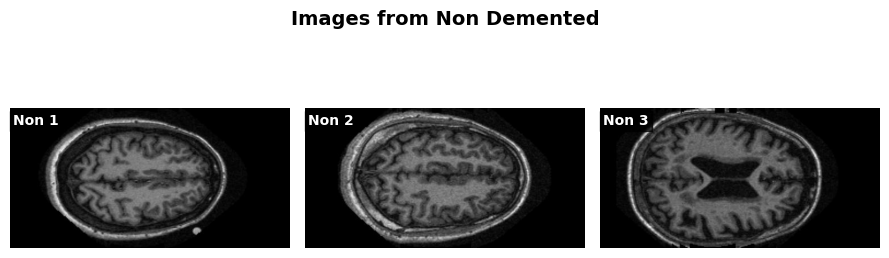

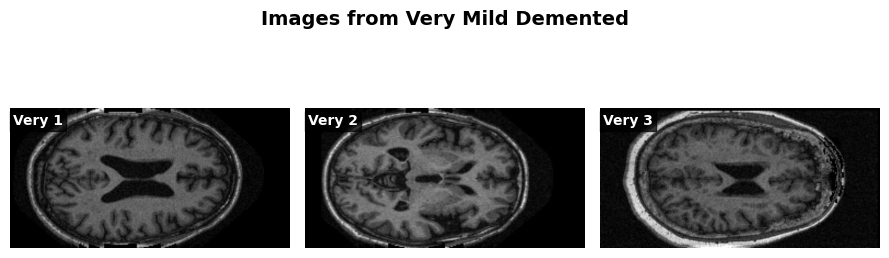

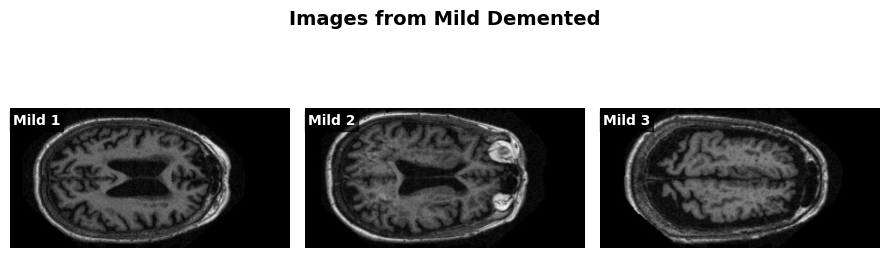

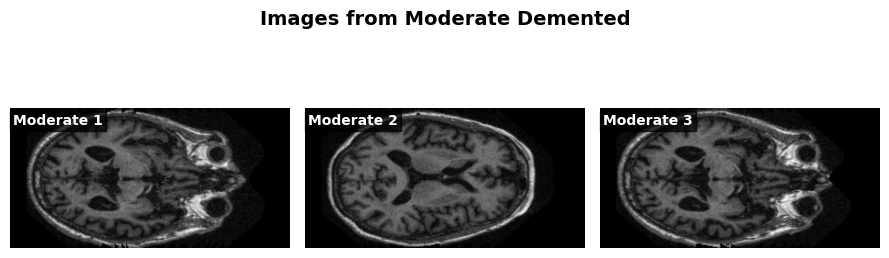

In [5]:
import matplotlib.pyplot as plt
from PIL import Image

def display_images_with_text(file_paths, category_name, endings=['150', '151', '152']):
    matching_files = []
    for ending in endings:
        matching_files.extend([img for img in file_paths if img.endswith(ending + '.jpg')])

    num_images = min(len(matching_files), 3)
    if num_images == 0:
        print(f"No matching images found for category: {category_name}")
        return

    plt.figure(figsize=(3 * num_images, 3))
    plt.suptitle(f"Images from {category_name}", fontsize=14, fontweight='bold')

    for i in range(num_images):
        img_path = matching_files[i]
        img = Image.open(img_path)

        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis('off')

     
        plt.text(
            5, 10,
            f"{category_name.split()[0]} {i + 1}",
            color='white',
            fontsize=10,
            weight='bold',
            ha='left',
            va='top',
            bbox=dict(facecolor='black', alpha=0.7, pad=2)
        )

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


display_images_with_text(non_demented, "Non Demented")
display_images_with_text(very_mild_demented, "Very Mild Demented")
display_images_with_text(mild_demented, "Mild Demented")
display_images_with_text(moderate_demented, "Moderate Demented")

In [6]:
def get_info_from_filename(filename):
    pattern = re.compile('OAS1_(\d+)_MR(\d+)_mpr-(\d+)_(\d+).jpg')
    match = pattern.match(filename)
    patient_id = match.group(1)
    mr_id = match.group(2)
    scan_id = match.group(3)
    layer_id = match.group(4)

    return patient_id, mr_id, scan_id, layer_id

In [7]:
def create_ref_df(dataset_path):
    paths, labels = [], []
    patient_ids, mr_ids, scan_ids, layer_ids = [], [], [], []

    # Iterate through folders in the dataset_path
    for folder in os.listdir(dataset_path):
        
        # Iterate through files in each folder
        for file in os.listdir(os.path.join(dataset_path, folder)):

            # Extract information from the filename using get_info_from_filename function
            patient_id, mr_id, scan_id, layer_id = get_info_from_filename(file)

            # Append information to respective lists
            paths.append(os.path.join(dataset_path, folder, file))
            labels.append(folder)
            patient_ids.append(patient_id)
            mr_ids.append(mr_id)
            scan_ids.append(scan_id)
            layer_ids.append(layer_id)

    # Create a DataFrame from the collected information
    ref_df = pd.DataFrame({
        'path': paths,
        'label': labels,
        'patient_id': patient_ids,
        'mr_id': mr_ids,
        'scan_id': scan_ids,
        'layer_id': layer_ids
    })

    # Convert columns to appropriate data types
    ref_df = ref_df.astype({
        'path': 'string',
        'label': 'string',
        'patient_id': 'int64',
        'mr_id': 'int64',
        'scan_id': 'int64',
        'layer_id': 'int64'
    })

    return ref_df

In [8]:
# Applying the function defined above
ref_df = create_ref_df('/kaggle/input/imagesoasis/Data')

In [9]:
def load_images(ref_df):
    labels = []
    images = []
    paths = []

    # Iterate through rows of the reference DataFrame
    for idx, row in tqdm(ref_df.iterrows(), total=ref_df.shape[0]):
        
        # Load image using PIL and convert it to a grayscale numpy array
        images.append(np.array(Image.open(row['path']).convert('L')))
        
        # Append label and path to respective lists
        labels.append(row['label'])
        paths.append(row['path'])
    
    # Return lists of images, labels, and paths
    return images, labels, paths

In [10]:
# Applying the function defined above
images, labels, paths = load_images(ref_df)

100%|██████████| 86437/86437 [08:08<00:00, 176.97it/s]


In [11]:
def get_image_stats(images, labels, paths):
    means, stds, widths, heights = [], [], [], []
    skewnesses = []
    
    # Iterate through the images
    for image in tqdm(images):
        
        # Calculate mean and standard deviation
        means.append(np.mean(image))
        stds.append(np.std(image))
        
        # Get image width and height
        widths.append(image.shape[0])
        heights.append(image.shape[1])
        
        # Calculate skewness of the image histogram
        image_hist = np.histogram(image.flatten())[0]
        skewnesses.append(skew(image_hist))
    
    # Create a DataFrame with image statistics
    image_stats = pd.DataFrame({
        'mean': means,
        'std': stds,
        'width': widths,
        'height': heights,
        'skew': skewnesses
    })
    
    # Add labels and paths to the DataFrame
    image_stats['label'] = labels
    image_stats['path'] = paths
    
    return image_stats

In [12]:
# Applying the function defined above
image_stats = get_image_stats(images, labels, paths)

100%|██████████| 86437/86437 [05:18<00:00, 271.41it/s]


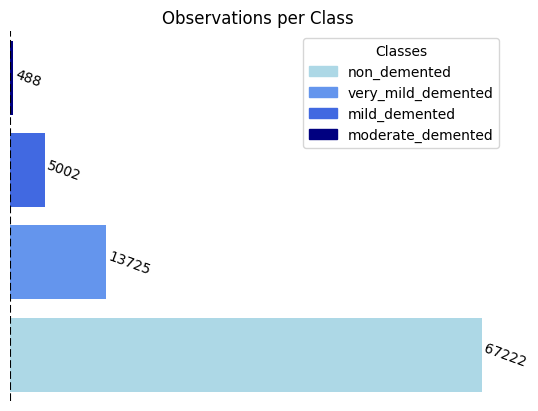

In [13]:
# Defining class_names, frequencies
frequencies = [len(non_demented),  len(very_mild_demented), len(moderate_demented), len(mild_demented),]
class_names = ["non_demented", "very_mild_demented", "moderate_demented", "mild_demented"]

# Sorting class_names and frequencies in descending order
sorted_indices = np.argsort(frequencies)[::-1]
class_names = np.array(class_names)[sorted_indices]
frequencies = np.array(frequencies)[sorted_indices]

# Navy blue gradient color palette with 4 distinct colors
navy_blue_palette = LinearSegmentedColormap.from_list("navy_blue_palette", ["lightblue", "cornflowerblue", "royalblue", "navy"], N=4)

# Bar plot with adjusted y-axis limits and navy blue gradient colors
fig, ax = plt.subplots()
bp = ax.barh(np.arange(len(class_names)), frequencies, color=navy_blue_palette(np.linspace(0, 1, len(class_names))))

# Adjusted y-axis limits
ax.set_ylim(-0.5, len(class_names)-0.5)

# Class names as y-axis labels
ax.set_yticks(np.arange(len(class_names)))
ax.set_yticklabels(class_names)

# Hide axes
ax.axis('off')

# Frequency values to the right of each bar with a reduced offset
for i, frequency in enumerate(frequencies):
    ax.text(frequency + 0.1, i, frequency, ha='left', va='center', rotation=-20)

# Vertical line at 0 for clarity
ax.axvline(x=0, linestyle='--', color='black')

# Legend
handles = [plt.Rectangle((0, 0), 1, 1, color=navy_blue_palette(i)) for i in range(4)]
ax.legend(handles, class_names, loc="upper right", title="Classes")

# Plot title
plt.title("Observations per Class")

plt.show()

plt.show()

In [14]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

pio.renderers.default = 'iframe_connected'

colors = {
    'Non Demented': 'cornflowerblue',
    'Very mild Dementia': 'mediumseagreen',
    'Mild Dementia': 'salmon',
    'Moderate Dementia': 'mediumpurple'
}

fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("Mean Histogram Value", "Standard Deviation", "Skewness")
)

for label in image_stats['label'].unique():
    # Mean
    fig.add_trace(
        go.Box(
            y=image_stats[image_stats['label'] == label]['mean'],
            name=label,
            boxpoints="all",
            marker_color=colors.get(label, 'gray'),
            line=dict(color=colors.get(label, 'gray')),
            showlegend=True
        ),
        row=1, col=1
    )
    
    # Std
    fig.add_trace(
        go.Box(
            y=image_stats[image_stats['label'] == label]['std'],
            name=label,
            boxpoints="all",
            marker_color=colors.get(label, 'gray'),
            line=dict(color=colors.get(label, 'gray')),
            showlegend=False
        ),
        row=1, col=2
    )
    
    # Skewness
    fig.add_trace(
        go.Box(
            y=image_stats[image_stats['label'] == label]['skew'],
            name=label,
            boxpoints="all",
            marker_color=colors.get(label, 'gray'),
            line=dict(color=colors.get(label, 'gray')),
            showlegend=False
        ),
        row=1, col=3
    )

fig.update_layout(height=500, width=1200, title_text="Image Statistics by Dementia Category")
fig.show()

In [15]:
# Set seed for random sampling
random.seed(42)


# Split off a test set for the moderate_demented class
moderate_demented_train, moderate_demented_test = train_test_split(
    moderate_demented, test_size=0.2, random_state=42
)

# Split off a test set for the mild_demented class
mild_demented_train, mild_demented_test = train_test_split(
    mild_demented, test_size=0.2, random_state=42
)

# Split off a test set for the very_mild_demented class
very_mild_demented_train, very_mild_demented_test = train_test_split(
    very_mild_demented, test_size=0.2, random_state=42
)

# Split off a test set for the non_demented class
non_demented_train, non_demented_test = train_test_split(
    non_demented, test_size=0.2, random_state=42
)

In [16]:
# Check number of train images per category
print(len(non_demented_train))
print(len(very_mild_demented_train))
print(len(mild_demented_train))
print(len(moderate_demented_train))

53777
10980
4001
390


In [17]:
# Specify the target number of samples for each class
target_samples = 5000

# Oversample small classes
moderate_demented_samp = random.choices(moderate_demented_train, k=target_samples)
mild_demented_samp = random.choices(mild_demented_train, k=target_samples)

# Undersample large classes
very_mild_demented_samp = random.sample(very_mild_demented_train, k=target_samples)
non_demented_samp = random.sample(non_demented_train, k=target_samples)

In [18]:
# Check results
print(len(non_demented_samp))
print(len(very_mild_demented_samp))
print(len(mild_demented_samp))
print(len(moderate_demented_samp))

5000
5000
5000
5000


In [19]:
# Check the number of test images per category
print(len(non_demented_test))
print(len(very_mild_demented_test))
print(len(mild_demented_test))
print(len(moderate_demented_test))

13445
2745
1001
98


In [20]:
# Specify the target number of samples for each class
target_samples = 640

# Undersample large classes
mild_demented_test = random.sample(mild_demented_test, k=target_samples)
very_mild_demented_test = random.sample(very_mild_demented_test, k=target_samples)
non_demented_test = random.sample(non_demented_test, k=target_samples)

In [21]:
# One-hot encoder for class labels 
encoder = OneHotEncoder()
encoder.fit([[0],[1],[2],[3]])

OneHotEncoder()

In [22]:
# Empty objects to store the data and the class labels (result) in
data = []
result = []

# Loop through each category and transform data and result into right format (128x128x3 & one-hot encoded) 
# and merge categories together
for path in non_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[0]]).toarray())

for path in very_mild_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[1]]).toarray())
        
for path in mild_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[2]]).toarray()) 
        
for path in moderate_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[3]]).toarray())

In [23]:
# Transform data to numpy array
data = np.array(data)

# Check shape
data.shape

(20000, 128, 128, 3)

In [24]:
# Transform labels to numpy array
result = np.array(result)

# Reshape to the one-hot encoded format 
result = result.reshape((data.shape[0],4)) 

# Check shape 
result.shape

(20000, 4)

In [25]:
# Split in validation and train data 
x_train,x_val,y_train,y_val = train_test_split(data,result, test_size=0.20, shuffle=True, random_state=42)

In [26]:
data_test = []
result_test = []

for path in non_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[0]]).toarray())
        
for path in very_mild_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[1]]).toarray())
        
for path in mild_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[2]]).toarray()) 
        
for path in moderate_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[3]]).toarray())

In [27]:
# Transform data to numpy array
data_test = np.array(data_test)
data_test.shape

(2018, 128, 128, 3)

In [28]:
# Transform labels to numpy array
result_test = np.array(result_test)
result_test = result_test.reshape((data_test.shape[0],4)) 
result_test.shape

(2018, 4)

In [29]:
# Change names to x_test and y_test 
x_test = data_test
y_test = result_test

In [30]:
# Convert labels to integers
y_train_int = np.argmax(y_train, axis=1)
y_val_int = np.argmax(y_val, axis=1)

In [25]:
base_model = tf.keras.applications.ResNet50(
    weights='imagenet', include_top=False, input_shape=(224, 224, 3))

base_model.trainable = False  # Freeze all layers

model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(4, activation='softmax')
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,500 (90.98 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [26]:
history = model.fit(
    train_dataset,
    validation_data=test_dataset,
    epochs=10
)

Epoch 1/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 151s 64ms/step - accuracy: 0.7891 - loss: 0.5182 - val_accuracy: 0.8495 - val_loss: 0.3546
Epoch 2/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 129s 59ms/step - accuracy: 0.8327 - loss: 0.3806 - val_accuracy: 0.8561 - val_loss: 0.3182
Epoch 3/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 131s 60ms/step - accuracy: 0.8564 - loss: 0.3237 - val_accuracy: 0.9017 - val_loss: 0.2311
Epoch 4/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 131s 60ms/step - accuracy: 0.8737 - loss: 0.2899 - val_accuracy: 0.9094 - val_loss: 0.2152
Epoch 5/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 131s 60ms/step - accuracy: 0.8864 - loss: 0.2598 - val_accuracy: 0.9226 - val_loss: 0.1895
Epoch 6/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 131s 60ms/step - accuracy: 0.8966 - loss: 0.2405 - val_accuracy: 0.9262 - val_loss: 0.1797
Epoch 7/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 132s 61ms/step - accuracy: 0.9064 - loss: 0.2197 - val_accuracy: 0.9291 - val_loss: 0.1740
Epoch 8/10
2161/2161 ━━━━━━━━━━━━━━━━━━━━ 132s 60ms/step - accuracy: 

In [27]:
loss, acc = model.evaluate(test_dataset)
print(f"\nTest Accuracy: {acc * 100:.2f}%")

# Get predictions
y_true = np.argmax(np.vstack([y for x, y in test_dataset]), axis=1)
y_pred = np.argmax(model.predict(test_dataset), axis=1)

from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred, target_names=classes))

541/541 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step - accuracy: 0.9519 - loss: 0.1315

Test Accuracy: 95.09%
541/541 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step
                    precision    recall  f1-score   support

     Mild Dementia       0.91      0.82      0.86      1000
 Moderate Dementia       1.00      0.50      0.67        98
      Non Demented       0.98      0.97      0.97     13445
Very mild Dementia       0.84      0.92      0.88      2745

          accuracy                           0.95     17288
         macro avg       0.93      0.80      0.85     17288
      weighted avg       0.95      0.95      0.95     17288



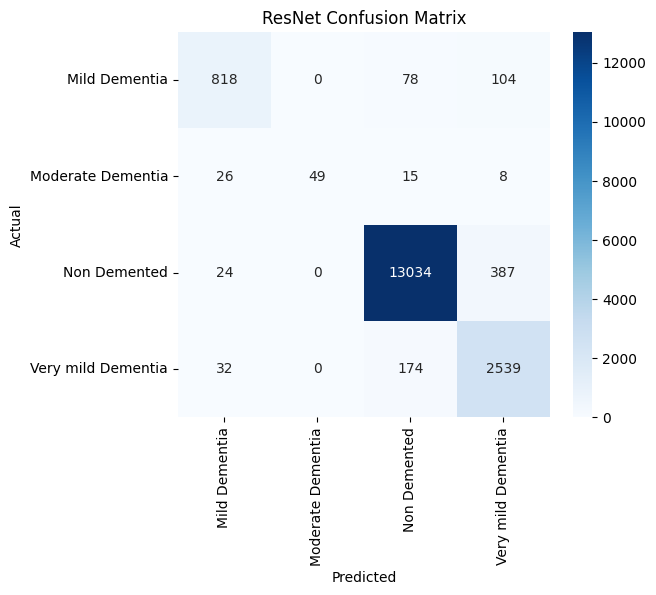

In [28]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.title("ResNet Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

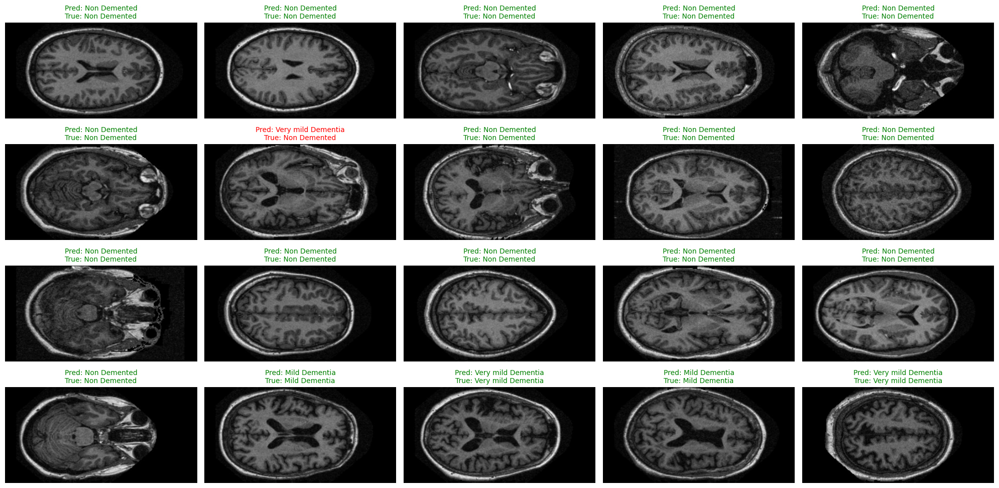

In [30]:
import random

# Pick 20 random indices from test dataset
random_indices = random.sample(range(len(test_paths)), 20)

plt.figure(figsize=(20, 10))

for i, idx in enumerate(random_indices):
    img_path = test_paths[idx]
    true_label = np.argmax(test_labels[idx])
    
    # Preprocess the image for prediction
    img = preprocess_image(img_path)
    img_expanded = tf.expand_dims(img, axis=0)
    prediction = model.predict(img_expanded, verbose=0)
    predicted_label = np.argmax(prediction)
    
    # Load original image for visualization
    original_img = Image.open(img_path)
    
    # Display
    plt.subplot(4, 5, i + 1)
    plt.imshow(original_img)
    color = "green" if predicted_label == true_label else "red"
    plt.title(
        f"Pred: {classes[predicted_label]}\nTrue: {classes[true_label]}",
        color=color,
        fontsize=10
    )
    plt.axis("off")

plt.tight_layout()
plt.show()


In [59]:
import os
import pandas as pd
from tqdm import tqdm

# Path to dataset (Kaggle usually mounts input datasets under /kaggle/input/)
dataset_path = "/kaggle/input/amd-dataset/combined_images"

images = []
labels = []

# Loop through folders (class names)
for folder in tqdm(os.listdir(dataset_path)):
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):  # only process directories
        for image_filename in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_filename)
            images.append(image_path)
            labels.append(folder)  # folder name as label

# Create DataFrame
df = pd.DataFrame({'image': images, 'label': labels})

# Display first 5 rows
df.head()

100%|██████████| 4/4 [00:00<00:00,  5.34it/s]


,image,label
0,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
1,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
2,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
3,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
4,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented


Exact counts for each class:
label
NonDemented         12800
VeryMildDemented    11200
ModerateDemented    10000
MildDemented        10000
Name: count, dtype: int64


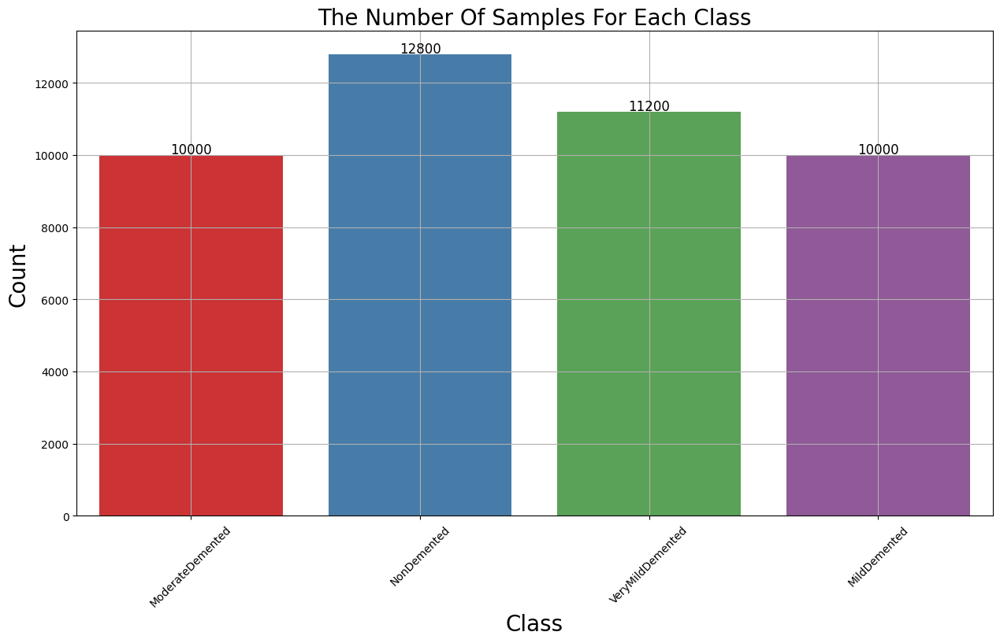

In [60]:
# Assuming `df` is your DataFrame and `label` is the column with class labels
class_counts = df['label'].value_counts()

# Print exact counts
print("Exact counts for each class:")
print(class_counts)

# Plot the class distribution
plt.figure(figsize=(15, 8))
ax = sns.countplot(x=df['label'], palette='Set1')
ax.set_xlabel("Class", fontsize=20)
ax.set_ylabel("Count", fontsize=20)
plt.title('The Number Of Samples For Each Class', fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)

# Annotate each bar with the exact count
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show()

In [9]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.2, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [11]:
# --- ResNet50 transfer learning model: training + evaluation ---
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam


image_size = (224,224)
batch_size = 32

# --- Create data generators specifically for ResNet50 preprocessing (DON'T rescale separately) ---
resnet_preprocess = tf.keras.applications.resnet.preprocess_input

datagen_resnet = ImageDataGenerator(
    preprocessing_function=resnet_preprocess,
    horizontal_flip=True
)

train_resnet_gen = datagen_resnet.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

val_resnet_gen = datagen_resnet.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_resnet_gen = datagen_resnet.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Save class indices/order for later
resnet_classes = list(train_resnet_gen.class_indices.keys())

Found 35200 validated image filenames belonging to 4 classes.
Found 4400 validated image filenames belonging to 4 classes.
Found 4400 validated image filenames belonging to 4 classes.


In [12]:
# --- Build ResNet50 model (base + new head) ---
base = ResNet50(weights='imagenet', include_top=False, input_shape=(image_size[0], image_size[1], 3))
base.trainable = False  # freeze base initially

x = base.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(len(resnet_classes), activation='softmax')(x)

resnet_model = Model(inputs=base.input, outputs=outputs)

# Compile
resnet_model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
resnet_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,638,852 (93.99 MB)

 Trainable params: 1,051,140 (4.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [13]:
# Early stopping (reuse or make a new one)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

early_stop_resnet = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7, verbose=1)

# Optional: checkpoint to save best weights
checkpoint = ModelCheckpoint('best_resnet50.h5', monitor='val_loss', save_best_only=True, verbose=1)

# Train the ResNet head
history_resnet = resnet_model.fit(
    train_resnet_gen,
    validation_data=val_resnet_gen,
    epochs=10,
    callbacks=[early_stop_resnet, reduce_lr, checkpoint]
)


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5044 - loss: 1.1275
Epoch 1: val_loss improved from inf to 0.75162, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 133s 103ms/step - accuracy: 0.5045 - loss: 1.1274 - val_accuracy: 0.6641 - val_loss: 0.7516 - learning_rate: 1.0000e-04
Epoch 2/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.6579 - loss: 0.7682
Epoch 2: val_loss improved from 0.75162 to 0.68126, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 126s 100ms/step - accuracy: 0.6579 - loss: 0.7682 - val_accuracy: 0.6905 - val_loss: 0.6813 - learning_rate: 1.0000e-04
Epoch 3/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.6888 - loss: 0.6894
Epoch 3: val_loss improved from 0.68126 to 0.60763, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 109s 99ms/step - accuracy: 0.6889 - loss: 0.6894 - val_accuracy: 0.7443 - val_loss: 0.6076 - learning_rate: 1.0000e-04
Epoch 4/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7156 - loss: 0.6432
Epoch 4: val_loss improved from 0.60763 to 0.59661, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 143s 99ms/step - accuracy: 0.7156 - loss: 0.6432 - val_accuracy: 0.7398 - val_loss: 0.5966 - learning_rate: 1.0000e-04
Epoch 5/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7391 - loss: 0.6010
Epoch 5: val_loss improved from 0.59661 to 0.54374, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 109s 99ms/step - accuracy: 0.7391 - loss: 0.6010 - val_accuracy: 0.7707 - val_loss: 0.5437 - learning_rate: 1.0000e-04
Epoch 6/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7520 - loss: 0.5729
Epoch 6: val_loss improved from 0.54374 to 0.51314, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 109s 99ms/step - accuracy: 0.7520 - loss: 0.5728 - val_accuracy: 0.7975 - val_loss: 0.5131 - learning_rate: 1.0000e-04
Epoch 7/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7652 - loss: 0.5426
Epoch 7: val_loss improved from 0.51314 to 0.50054, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 109s 99ms/step - accuracy: 0.7652 - loss: 0.5426 - val_accuracy: 0.7923 - val_loss: 0.5005 - learning_rate: 1.0000e-04
Epoch 8/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7789 - loss: 0.5115
Epoch 8: val_loss improved from 0.50054 to 0.47855, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 109s 99ms/step - accuracy: 0.7789 - loss: 0.5115 - val_accuracy: 0.7916 - val_loss: 0.4785 - learning_rate: 1.0000e-04
Epoch 9/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7884 - loss: 0.4938
Epoch 9: val_loss improved from 0.47855 to 0.44365, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 142s 99ms/step - accuracy: 0.7884 - loss: 0.4938 - val_accuracy: 0.8168 - val_loss: 0.4436 - learning_rate: 1.0000e-04
Epoch 10/10
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7985 - loss: 0.4755
Epoch 10: val_loss improved from 0.44365 to 0.42911, saving model to best_resnet50.h5



1100/1100 ━━━━━━━━━━━━━━━━━━━━ 109s 99ms/step - accuracy: 0.7985 - loss: 0.4755 - val_accuracy: 0.8298 - val_loss: 0.4291 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 10.


138/138 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - accuracy: 0.8256 - loss: 0.4299
ResNet50 Test Accuracy: 0.8255, Loss: 0.4340
138/138 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step


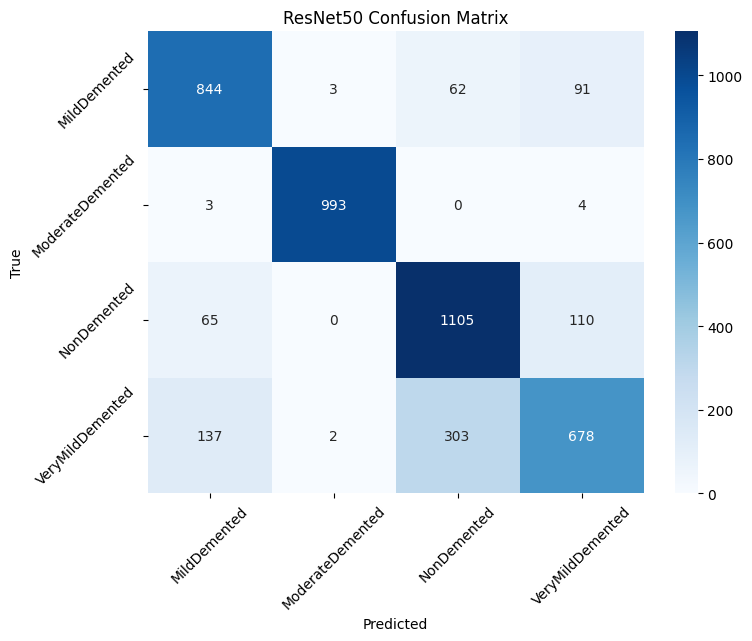

Classification Report:
                  precision    recall  f1-score   support

    MildDemented       0.80      0.84      0.82      1000
ModerateDemented       0.99      0.99      0.99      1000
     NonDemented       0.75      0.86      0.80      1280
VeryMildDemented       0.77      0.61      0.68      1120

        accuracy                           0.82      4400
       macro avg       0.83      0.83      0.82      4400
    weighted avg       0.82      0.82      0.82      4400

ResNet50 Test Accuracy: 0.8255


In [14]:
# Evaluate on test set
loss_resnet, acc_resnet = resnet_model.evaluate(test_resnet_gen, verbose=1)
print(f"ResNet50 Test Accuracy: {acc_resnet:.4f}, Loss: {loss_resnet:.4f}")

# Predictions + confusion matrix + classification report
y_pred_proba = resnet_model.predict(test_resnet_gen, verbose=1)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test_resnet_gen.classes

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=resnet_classes, yticklabels=resnet_classes, cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("ResNet50 Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=resnet_classes))

# (Optional) Compare CNN vs ResNet on test accuracy
print(f"ResNet50 Test Accuracy: {acc_resnet:.4f}")

/tmp/ipython-input-349821921.py:44: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-349821921.py:44: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


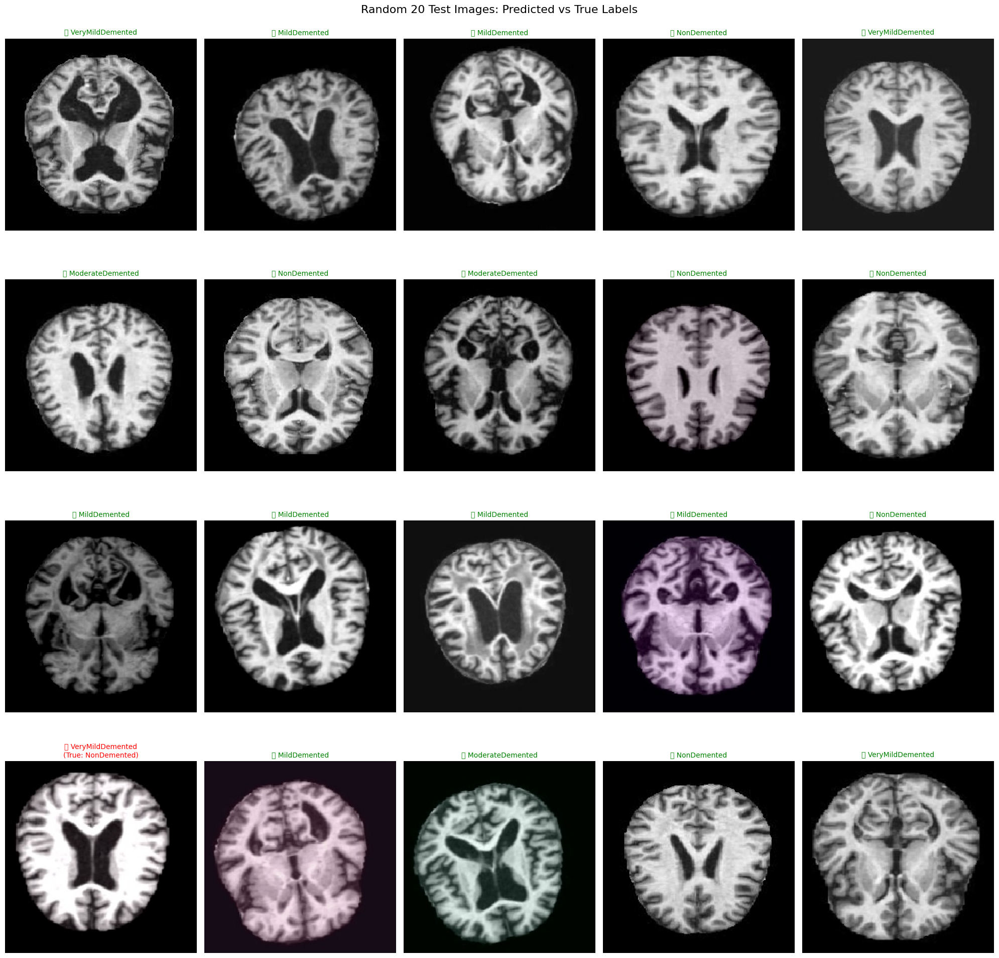

In [15]:
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# --- Check 20 random test images and visualize predictions ---
# Get all file paths and labels from the test dataframe
test_df = df_test.reset_index(drop=True)

# Make predictions on the full test set
y_pred_probs = resnet_model.predict(test_resnet_gen, verbose=0)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = test_resnet_gen.classes
class_labels = list(test_resnet_gen.class_indices.keys())

# Pick 20 random test indices
sample_indices = random.sample(range(len(test_df)), 20)

plt.figure(figsize=(20, 20))
for i, idx in enumerate(sample_indices):
    img_path = test_df.loc[idx, 'image']
    true_label = test_df.loc[idx, 'label']

    # Load and preprocess image for display (not for prediction)
    img = image.load_img(img_path, target_size=image_size)
    img_arr = image.img_to_array(img)

    # Predicted label
    pred_idx = y_pred_classes[idx]
    pred_label = class_labels[pred_idx]

    # Display image
    plt.subplot(4, 5, i + 1)
    plt.imshow(img_arr.astype('uint8'))
    plt.axis('off')

    # Title formatting (✅ correct / ❌ wrong)
    if pred_label == true_label:
        plt.title(f"✅ {pred_label}", color='green', fontsize=10)
    else:
        plt.title(f"❌ {pred_label}\n(True: {true_label})", color='red', fontsize=10)

plt.suptitle("Random 20 Test Images: Predicted vs True Labels", fontsize=16)
plt.tight_layout()
plt.show()


In [1]:
import os
import pandas as pd
from tqdm import tqdm

# Path to dataset (Kaggle usually mounts input datasets under /kaggle/input/)
dataset_path = "/kaggle/input/adni-dataset/AugmentedAlzheimerDataset"

images = []
labels = []

# Loop through folders (class names)
for folder in tqdm(os.listdir(dataset_path)):
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):  # only process directories
        for image_filename in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_filename)
            images.append(image_path)
            labels.append(folder)  # folder name as label

# Create DataFrame
df = pd.DataFrame({'image': images, 'label': labels})

# Display first 5 rows
df.head()

100%|██████████| 5/5 [00:00<00:00,  5.58it/s]


,image,label
0,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
1,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
2,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
3,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
4,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload


In [7]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm
# from imblearn.over_sampling import SMOTE
from sklearn.utils.multiclass import check_classification_targets


In [4]:
import os
import pandas as pd
from tqdm import tqdm

# ✅ Path to dataset after extraction
dataset_path = "/content/dataset/AugmentedAlzheimerDataset"

# Lists to store image paths and labels
images = []
labels = []

# ✅ Loop through folders (each folder = class name)
for folder in tqdm(os.listdir(dataset_path)):
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):  # only process directories
        for image_filename in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_filename)
            images.append(image_path)
            labels.append(folder)  # folder name = label

# ✅ Create DataFrame
df = pd.DataFrame({'image': images, 'label': labels})

# Display first 5 rows
df.head()

100%|██████████| 5/5 [00:00<00:00, 45.54it/s]


,image,label
0,/content/dataset/AugmentedAlzheimerDataset/EMC...,EMCI
1,/content/dataset/AugmentedAlzheimerDataset/EMC...,EMCI
2,/content/dataset/AugmentedAlzheimerDataset/EMC...,EMCI
3,/content/dataset/AugmentedAlzheimerDataset/EMC...,EMCI
4,/content/dataset/AugmentedAlzheimerDataset/EMC...,EMCI


In [6]:

# ===============================
# 🔹 Train / Validation / Test Split
# ===============================
X_train, X_test1, y_train, y_test1 = train_test_split(
    df['image'], df['label'], test_size=0.2, random_state=42, stratify=df['label'], shuffle=True
)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.5, random_state=42, stratify=y_test1, shuffle=True
)

df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_val   = pd.DataFrame({'image': X_val,   'label': y_val})
df_test  = pd.DataFrame({'image': X_test,  'label': y_test})

print(f"Train: {len(df_train)}, Val: {len(df_val)}, Test: {len(df_test)}")


Train: 36592, Val: 4574, Test: 4574


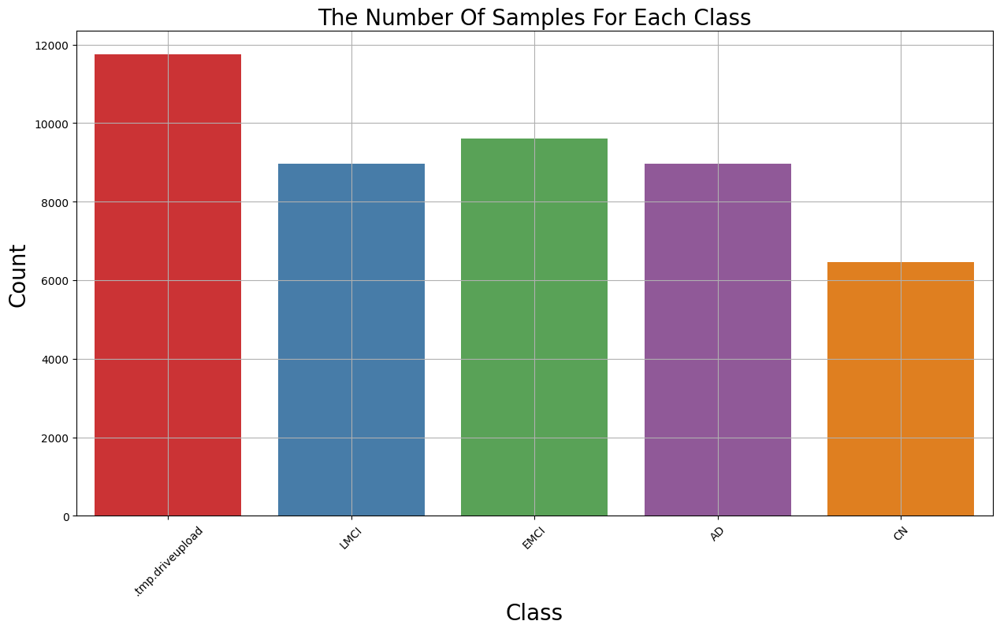

In [8]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [9]:
# ===============================
# 🔹 Image Generators
# ===============================
image_size = (224, 224)
batch_size = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)

test_val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_dataframe(
    df_train, x_col='image', y_col='label',
    target_size=image_size, batch_size=batch_size,
    class_mode='categorical', shuffle=True, seed=42
)

val_generator = test_val_datagen.flow_from_dataframe(
    df_val, x_col='image', y_col='label',
    target_size=image_size, batch_size=batch_size,
    class_mode='categorical', shuffle=False
)

test_generator = test_val_datagen.flow_from_dataframe(
    df_test, x_col='image', y_col='label',
    target_size=image_size, batch_size=batch_size,
    class_mode='categorical', shuffle=False
)

class_indices = train_generator.class_indices
num_classes = len(class_indices)
print("\n🔸 Class indices:", class_indices)

Found 27187 validated image filenames belonging to 4 classes.
Found 3399 validated image filenames belonging to 4 classes.
Found 3398 validated image filenames belonging to 4 classes.

🔸 Class indices: {'AD': 0, 'CN': 1, 'EMCI': 2, 'LMCI': 3}


/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 9405 invalid image filename(s) in x_col="image". These filename(s) will be ignored.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 1175 invalid image filename(s) in x_col="image". These filename(s) will be ignored.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 1176 invalid image filename(s) in x_col="image". These filename(s) will be ignored.
  warnings.warn(


In [12]:
# ===============================
# 🔹 Build ResNet50 Model
# ===============================
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model.trainable = False  # freeze for feature extraction

inputs = keras.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

resnet_model = keras.Model(inputs, outputs, name="ResNet50_Alzheimer")

resnet_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

resnet_model.summary()

Model: "ResNet50_Alzheimer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,649,092 (94.03 MB)

 Trainable params: 1,056,260 (4.03 MB)

 Non-trainable params: 23,592,832 (90.00 MB)

In [13]:
# ===============================
# 🔹 Callbacks
# ===============================
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint = ModelCheckpoint("best_resnet50.h5", monitor='val_accuracy', save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)

# ===============================
# 🔹 Train Model
# ===============================
history = resnet_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[early_stop, checkpoint, reduce_lr]
)


Epoch 1/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.4618 - loss: 1.4851


850/850 ━━━━━━━━━━━━━━━━━━━━ 359s 409ms/step - accuracy: 0.4619 - loss: 1.4848 - val_accuracy: 0.6867 - val_loss: 0.7525 - learning_rate: 1.0000e-04
Epoch 2/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.6053 - loss: 1.0056


850/850 ━━━━━━━━━━━━━━━━━━━━ 332s 390ms/step - accuracy: 0.6053 - loss: 1.0055 - val_accuracy: 0.7123 - val_loss: 0.6519 - learning_rate: 1.0000e-04
Epoch 3/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.6331 - loss: 0.8932


850/850 ━━━━━━━━━━━━━━━━━━━━ 337s 396ms/step - accuracy: 0.6331 - loss: 0.8932 - val_accuracy: 0.7229 - val_loss: 0.6302 - learning_rate: 1.0000e-04
Epoch 4/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.6485 - loss: 0.8367


850/850 ━━━━━━━━━━━━━━━━━━━━ 342s 402ms/step - accuracy: 0.6485 - loss: 0.8367 - val_accuracy: 0.7340 - val_loss: 0.5873 - learning_rate: 1.0000e-04
Epoch 5/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step - accuracy: 0.6594 - loss: 0.7892


850/850 ━━━━━━━━━━━━━━━━━━━━ 348s 410ms/step - accuracy: 0.6594 - loss: 0.7892 - val_accuracy: 0.7502 - val_loss: 0.5727 - learning_rate: 1.0000e-04
Epoch 6/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.6827 - loss: 0.7415


850/850 ━━━━━━━━━━━━━━━━━━━━ 342s 402ms/step - accuracy: 0.6827 - loss: 0.7416 - val_accuracy: 0.7576 - val_loss: 0.5480 - learning_rate: 1.0000e-04
Epoch 7/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 343s 403ms/step - accuracy: 0.6818 - loss: 0.7303 - val_accuracy: 0.7558 - val_loss: 0.5519 - learning_rate: 1.0000e-04
Epoch 8/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 346s 407ms/step - accuracy: 0.6993 - loss: 0.7045 - val_accuracy: 0.7561 - val_loss: 0.5426 - learning_rate: 1.0000e-04
Epoch 9/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step - accuracy: 0.7015 - loss: 0.6860


850/850 ━━━━━━━━━━━━━━━━━━━━ 346s 407ms/step - accuracy: 0.7015 - loss: 0.6860 - val_accuracy: 0.7673 - val_loss: 0.5295 - learning_rate: 1.0000e-04
Epoch 10/10
850/850 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - accuracy: 0.7129 - loss: 0.6716


850/850 ━━━━━━━━━━━━━━━━━━━━ 349s 410ms/step - accuracy: 0.7129 - loss: 0.6716 - val_accuracy: 0.7690 - val_loss: 0.5233 - learning_rate: 1.0000e-04


107/107 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step


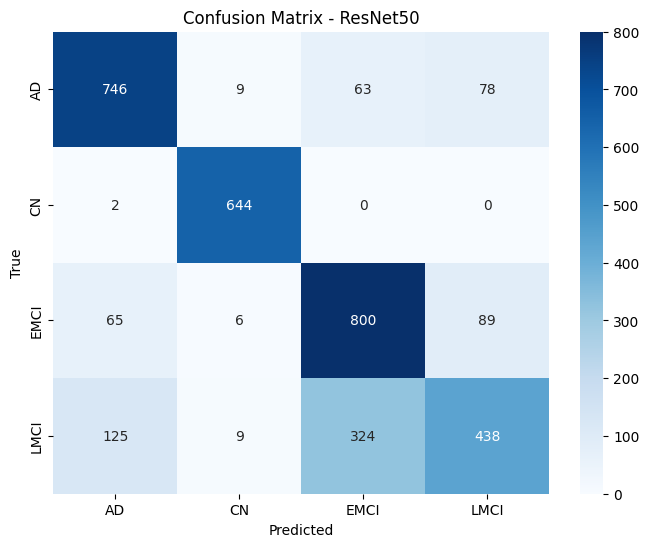


📊 Classification Report:

              precision    recall  f1-score   support

          AD       0.80      0.83      0.81       896
          CN       0.96      1.00      0.98       646
        EMCI       0.67      0.83      0.75       960
        LMCI       0.72      0.49      0.58       896

    accuracy                           0.77      3398
   macro avg       0.79      0.79      0.78      3398
weighted avg       0.77      0.77      0.77      3398



In [14]:
# ===============================
# 🔹 Evaluate on Test Set
# ===============================
y_true = test_generator.classes
y_pred_prob = resnet_model.predict(test_generator)
y_pred = np.argmax(y_pred_prob, axis=1)

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d',
            xticklabels=list(class_indices.keys()),
            yticklabels=list(class_indices.keys()),
            cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - ResNet50")
plt.show()

print("\n📊 Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=list(class_indices.keys())))

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


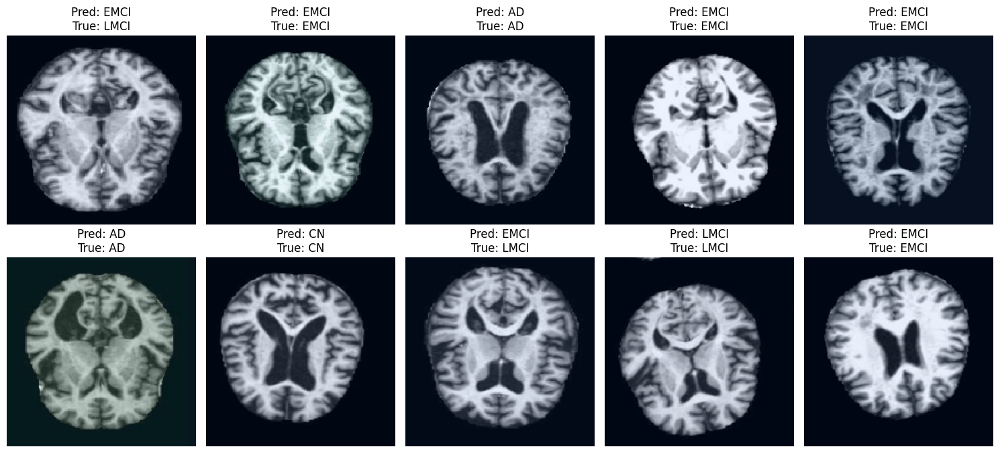

In [15]:
# ===============================
# 🔹 Sample Predictions
# ===============================
indices = random.sample(range(len(test_generator.filepaths)), 10)
plt.figure(figsize=(15,7))
class_labels = list(class_indices.keys())

for i, idx in enumerate(indices):
    img_path = test_generator.filepaths[idx]
    img = keras.preprocessing.image.load_img(img_path, target_size=image_size)
    img_array = keras.preprocessing.image.img_to_array(img)
    inp = np.expand_dims(img_array, axis=0)
    inp = preprocess_input(inp)
    pred = resnet_model.predict(inp)
    pred_class = np.argmax(pred)
    true_class = test_generator.classes[idx]

    plt.subplot(2,5,i+1)
    plt.imshow(keras.preprocessing.image.array_to_img(img_array))
    plt.title(f"Pred: {class_labels[pred_class]}\nTrue: {class_labels[true_class]}")
    plt.axis("off")

plt.tight_layout()
plt.show()